In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from tensorflow.keras.applications import VGG19
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")

Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image,tf.float32)
    return image

In [6]:
path = "/kaggle/input/monumentimagenotaugmented"
x = load(os.path.join(path, 'train/monumentimage_10000.jpg'))
print(x.shape)

(1365, 2048, 3)


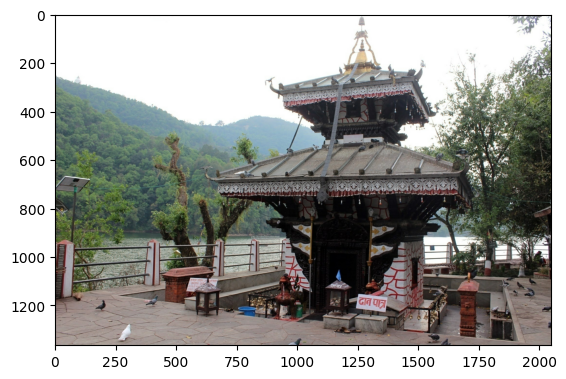

In [7]:
plt.imshow(x/255.0)

In [8]:
def normalize(real_image):
    real_image = (real_image / 255)
    return real_image

In [9]:
def random_crop(real_image):
    cropped_image = tf.image.random_crop(real_image, size = [256, 256, 3])
    return cropped_image

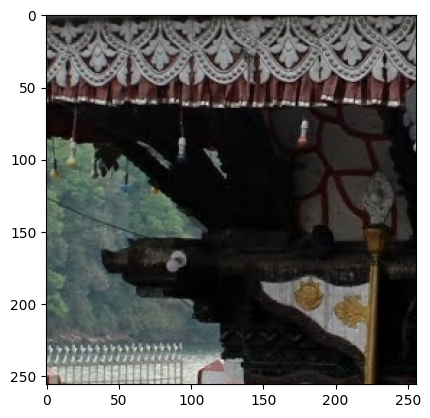

In [10]:
x_aug = random_crop(x)
plt.imshow(x_aug/255.0)

In [11]:
def resize(real_image):
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image

In [12]:
def rotate_image(image, angles, interpolation='BILINEAR'):
    """
    Rotate an image tensor by specified angles.

    Args:
    - image: Input image tensor with shape (batch_size, height, width, channels).
    - angles: Tensor of rotation angles in radians for each image in the batch.
    - interpolation: Interpolation method ('BILINEAR' or 'NEAREST').

    Returns:
    - Rotated image tensor.
    """
    batch_size, height, width, channels = tf.unstack(tf.shape(image))

    # Coordinates of the center of the image
    center_x = tf.cast(width, tf.float32) / 2.0
    center_y = tf.cast(height, tf.float32) / 2.0

    # Define transformation matrix
    rotation_matrix = tf.reshape(tf.stack([tf.cos(angles), -tf.sin(angles), center_x * (1 - tf.cos(angles)) + center_y * tf.sin(angles),
                                           tf.sin(angles), tf.cos(angles), -center_x * tf.sin(angles) + center_y * (1 - tf.cos(angles)),
                                           0.0, 0.0, 1.0], axis=1), shape=(-1, 3, 3))

    # Apply rotation to each pixel
    rotated_image = tfa.image.transform(image, rotation_matrix, interpolation)

    return rotated_image


In [13]:
def random_jitter(real_image):
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
    return real_image

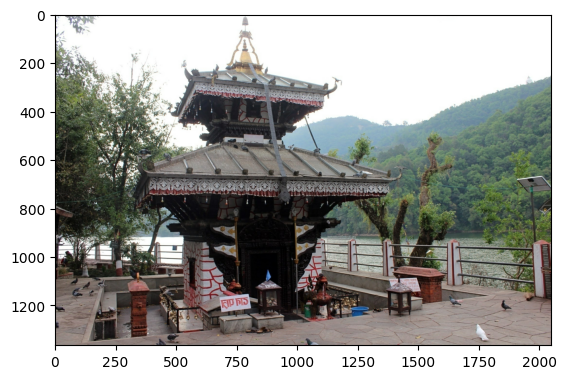

In [14]:
x_jitter = random_jitter(x)
plt.imshow(x_jitter/255.0)

In [15]:
def resize_with_aspect_ratio(image, constant_size):
        # Get image dimensions
        height, width = tf.shape(image)[0], tf.shape(image)[1]

        # Calculate aspect ratio
        aspect_ratio = tf.cast(width, tf.float32) / tf.cast(height, tf.float32)

        # Determine new dimensions based on constant size
        new_height = tf.cond(aspect_ratio >= 1.0,
                             lambda: constant_size,
                             lambda: tf.cast(constant_size / aspect_ratio, tf.int32))
        new_width = tf.cond(aspect_ratio >= 1.0,
                            lambda: tf.cast(constant_size * aspect_ratio, tf.int32),
                            lambda: constant_size)

        # Resize the image
        resized_image = tf.image.resize(image, [new_height, new_width])

        return resized_image

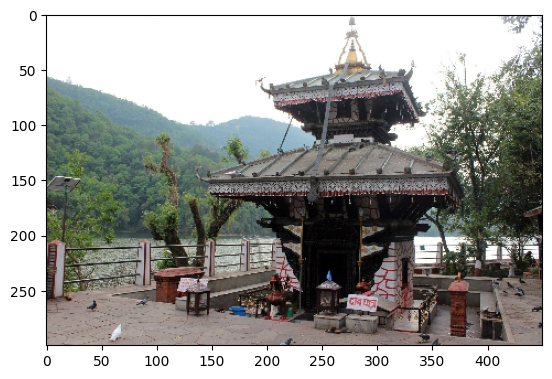

In [16]:
plt.imshow(resize_with_aspect_ratio(x,300)/255)

In [17]:
def load_train_images(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 300)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    # Define the rotation angle in radians
    rotation_angle = tf.constant(20.0 * (3.141592653589793 / 180.0), dtype=tf.float32)

    # Apply the rotation using tfa.image.rotate
    real_image = tfa.image.rotate(real_image, angles=rotation_angle)

#     # Example usage
#     angles = tf.placeholder(dtype=tf.float32, shape=(None,))
#     # Specify the rotation range in degrees
#     rotation_range = 15  # Adjust this value as needed
#     # Convert the rotation range to radians
#     rotation_range_rad = rotation_range * (np.pi / 180.0)
#     # Generate random rotation angles for each image in the batch
#     random_angles = tf.random.uniform(shape=(tf.shape(image)[0],), minval=-rotation_range_rad, maxval=rotation_range_rad)
#     # Apply custom rotation to the image with bilinear interpolation
#     real_image = rotate_image(real_image, random_angles, interpolation='BILINEAR')
    #     real_image = rotate(real_image)
    real_image = random_jitter(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [18]:
def load_test_image(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 256)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
#     real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [19]:
IMAGE_SIZE = 256
BATCH_SIZE = 16

In [20]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files(path + "/train/*")
train_dataset = train_dataset.map(load_train_images)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [21]:
validation_dataset = tf.data.Dataset.list_files(path + '/val/*')
validation_dataset = validation_dataset.map(load_test_image)
validation_dataset = validation_dataset.batch(BATCH_SIZE)
validation_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [22]:
# test_dataset = tf.data.Dataset.list_files(path + 'test/*.jpg')
# test_dataset = test_dataset.map(load_test_image)
# test_dataset = test_dataset.batch(1)
# test_dataset

In [23]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result
down_model = downsample(3,4)
down_result = down_model(tf.expand_dims(x, axis = 0))
print(down_result.shape)

(1, 683, 1024, 3)


In [24]:
# upsample block
def upsample(filters, size, dropout = False):
    init = tf.random_normal_initializer(0, 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    result.add(BatchNormalization())
    if dropout == True:
        result.add(Dropout(0.3))
    result.add(ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 1366, 2048, 3)


In [25]:
def generator(input_shape = (256,256,1), output_channels = 2):
    inputs = Input(shape = input_shape)
    down_stack = [
        downsample(32, 4, batchnorm=False),
        downsample(64, 4),
        downsample(128, 4),
        downsample(256, 4, dropout = True),
        downsample(512, 4, dropout = True)
    ]


    up_stack = [
        upsample(512, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(128, 4, dropout=True),
        upsample(64, 4),
        upsample(32, 4),
    ]
    init = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(2, 4, strides = 2, padding = "same", kernel_initializer = init, activation ="tanh")
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs = inputs, outputs = x)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 sequential_2 (Sequential)   (None, 128, 128, 32)         512       ['input_1[0][0]']             
                                                                                                  
 sequential_3 (Sequential)   (None, 64, 64, 64)           33024     ['sequential_2[0][0]']        
                                                                                                  
 sequential_4 (Sequential)   (None, 32, 32, 128)          131584    ['sequential_3[0][0]']        
                                                                                              

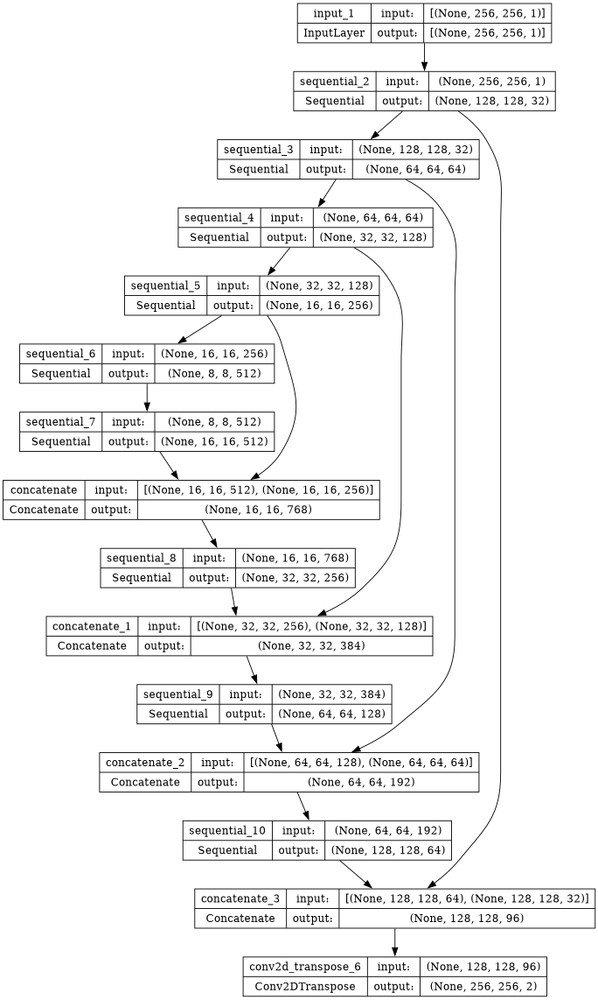

In [26]:
gen = generator()
gen.summary()
plot_model(gen, show_shapes=True, dpi = 64)

In [27]:
# gen.load_weights('/kaggle/input/imagenetmodelweights/gen_weight.keras')

In [28]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)

    inp = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 1], name = "input_image")
    tar = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 2], name = "target_image")
    x = Concatenate()([inp, tar])
    down1 = downsample(64,4,False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = [inp, tar], outputs = last)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_image (InputLayer)    [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 target_image (InputLayer)   [(None, 256, 256, 2)]        0         []                            
                                                                                                  
 concatenate_4 (Concatenate  (None, 256, 256, 3)          0         ['input_image[0][0]',         
 )                                                                   'target_image[0][0]']        
                                                                                                  
 sequential_12 (Sequential)  (None, 128, 128, 64)         3328      ['concatenate_4[0][0]'] 

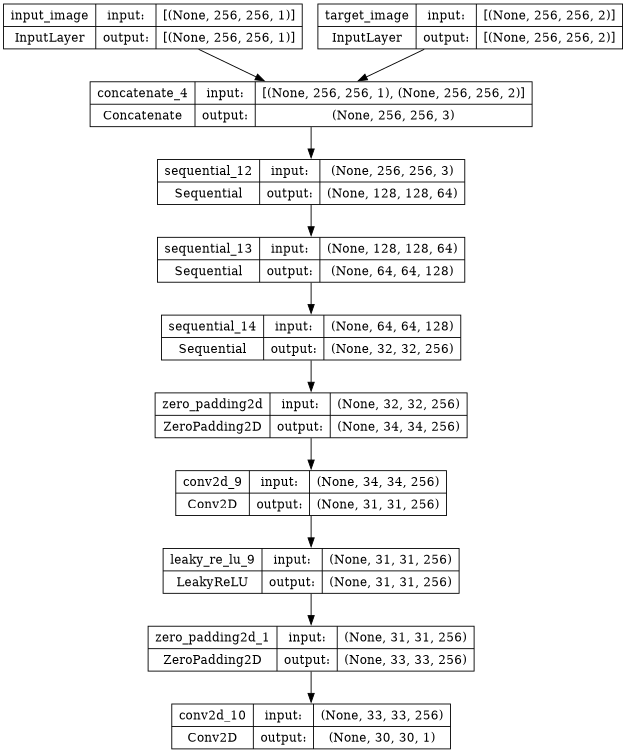

In [29]:
disc = discriminator()
disc.summary()
plot_model(disc, show_shapes=True, dpi = 64)

In [30]:
# disc.load_weights('/kaggle/input/imagenetmodelweights/disc_weight.keras')

In [31]:
# Function to create YUV image from Y, U, and V channels and then convert to rgb
def create_rgb_image(y_channel, uv_channel):
    # Assuming YUV format where Y, U, and V channels are separate
    # y_channel = np.array(y_channel)
    # uv_channel = np.array(uv_channel)
    u_channel, v_channel = tf.split(uv_channel, num_or_size_splits=2, axis=-1)

    # Combine Y, U, and V channels into a YUV image
    rgb_image = tf.image.yuv_to_rgb(tf.concat([y_channel, u_channel, v_channel], axis=-1))
    return rgb_image


In [32]:
LAMBDA = 100

In [33]:
# Define the perceptual loss function
def perceptual_loss(y_true, y_pred):
    vgg = VGG19(include_top=False, weights='imagenet', input_shape=(None, None, 3))
    vgg.trainable = False
    for layer in vgg.layers:
        layer.trainable = False
    model = Model(inputs=vgg.input, outputs=vgg.get_layer('block5_conv4').output)
    model.trainable = False

    y_true_features = model(y_true)
    y_pred_features = model(y_pred)

    return tf.reduce_mean(tf.square(y_true_features - y_pred_features))

In [34]:
def generator_loss(disc_generated_output,input_, gen_output, target):
    gan_loss = loss_function(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    p_loss = perceptual_loss(create_rgb_image(input_, gen_output), create_rgb_image(input_, target))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss) + 80*p_loss
    return total_gen_loss, gan_loss, l1_loss, p_loss

In [35]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [36]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [37]:
generator_optimizer = Adam(lr= 2e-4, beta_1=0.5)
discriminator_optimizer = Adam(lr = 2e-4, beta_1=0.5)

In [38]:
epochs = 250

In [39]:
# import tensorflow as tf
# from tensorflow.keras.applications import VGG19
# from tensorflow.keras.models import Model

# # Load the VGG19 model
# vgg = VGG19(weights='imagenet', include_top=False)

# # Select the layers you want to use for the LPIPS score
# selected_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1']

# # Create a model that outputs the selected layers
# outputs = [vgg.get_layer(name).output for name in selected_layers]
# model = Model(inputs=vgg.input, outputs=outputs)

# # Make sure the VGG model is not trainable
# model.trainable = False

# def lpips_score(image1, image2):
#     # Get the features for both images
#     image1_features = model(image1)
#     image2_features = model(image2)

#     # Initialize the score
#     score = 0

#     # For each feature layer...
#     for f1, f2 in zip(image1_features, image2_features):
#         # ... compute the mean squared error between the features
#         mse = tf.reduce_mean((f1 - f2)**2)
#         # ... and add it to the score
#         score += mse

#     return score

In [40]:
# from tensorflow.keras.applications.inception_v3 import InceptionV3
# from scipy.linalg import sqrtm

# # Load the pre-trained InceptionV3 model (weights will be downloaded if not present)
# pretrained_model = InceptionV3(weights='imagenet', include_top=True, pooling='avg')

# # Optionally, you can freeze the layers to prevent training
# for layer in pretrained_model.layers:
#     layer.trainable = False


# # Create a new model to extract features from an intermediate layer
# inception_model = tf.keras.Model(inputs=pretrained_model.input, outputs=pretrained_model.get_layer('avg_pool').input)
# def calculate_fid_score(images1, images2, inception_model):
#     # Ensure the batch dimension is removed for individual image predictions
#     images1 = np.squeeze(images1, axis=0)
#     images2 = np.squeeze(images2, axis=0)
    
#     # Resize images to the required size for the Inception model
#     images1 = tf.image.resize(images1, size=(299, 299))
#     images2 = tf.image.resize(images2, size=(299, 299))
    
#     # Extract features using the Inception model
#     features1 = inception_model.predict(np.expand_dims(images1, axis=0))
#     features2 = inception_model.predict(np.expand_dims(images2, axis=0))

#     # Remove batch dimension from features
#     features1 = np.squeeze(features1, axis=0)
#     features2 = np.squeeze(features2, axis=0)
#     #print(features1.shape)
#     # Calculate mean and covariance of feature representations
#     mean1 = np.mean(features1, axis=(0, 1, 2))
#     mean2 = np.mean(features2, axis=(0, 1, 2))
#     #print(features1.shape)
#     cov1 = np.cov(features1.transpose(2, 0, 1).reshape(features1.shape[-1], -1), rowvar=False)
#     cov2 = np.cov(features2.transpose(2, 0, 1).reshape(features2.shape[-1], -1), rowvar=False)
#     #print(cov2.shape)

#     # Calculate the squared Euclidean distance between means
#     sum_squared_diff = np.sum((mean1 - mean2)**2)

#     # Calculate the trace of the product of covariances
#     cov_sqrt = sqrtm(np.dot(cov1, cov2))
#     trace_cov_product = np.trace(cov1 + cov2 - 2 * cov_sqrt)

#     # Calculate FID score
#     fid_score = np.real(sum_squared_diff + trace_cov_product)
    
#     return fid_score

In [41]:
@tf.function
def train_step(input_image, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(input_image, training=True)
        disc_real_output = disc([input_image, target], training=True)
        disc_generated_output = disc([input_image, gen_output], training=True)
        gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
#         rgb_target = create_rgb_image(input_image, target)
#         rgb_generated = create_rgb_image(input_image, gen_output)
#         ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
#         psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#         lpips_values = lpips_score(rgb_target, rgb_generated)

        if epoch > 8:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, tf.constant([0]), tf.constant([0]), tf.constant([0])

In [42]:
@tf.function
def validation_step(input_image, target):
    # Generate output using the generator
    gen_output = gen(input_image)

    # Calculate losses without updating gradients
    disc_real_output = disc([input_image, target])
    disc_generated_output = disc([input_image, gen_output])

    gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
    disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
    rgb_target = create_rgb_image(input_image, target)
    rgb_generated = create_rgb_image(input_image, gen_output)
    ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
    psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
    #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
    return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, tf.constant([0]), tf.constant([0])

In [43]:
# @tf.function
# def test_step(input_image, target):
#     # Generate output using the generator
#     gen_output = gen(input_image)

#     # Calculate losses without updating gradients
#     disc_real_output = disc([input_image, target])
#     disc_generated_output = disc([input_image, gen_output])

#     gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
#     disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
#     rgb_target = create_rgb_image(input_image, target)
#     rgb_generated = create_rgb_image(input_image, gen_output)
#     ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
#     psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
#     fid_values = calculate_fid_score(rgb_target, rgb_generated, inception_model)
#     #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
#     return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, lpips_values, fid_values


In [44]:
os.mkdir('/kaggle/working/gen_output/')

In [45]:
def display_one_random_test_image(input_, target, gen_model, epoch):
    print("Displaying one random test image...")
    img_array = np.array(input_)
    generated_output_test = gen_model(input_)
    ssim = tf.image.ssim(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)
    psnr = tf.image.psnr(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)  
#     lpips = lpips_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)))
#     p_loss = perceptual_loss(create_rgb_image(input_, target), create_rgb_image(input_, generated_output_test))
#     fid_score = calculate_fid_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)), inception_model)
    # print(input_.shape)
    input_ = np.squeeze(input_, axis=0)
    # print(type(input_), type(target))
    # print(input_.shape, input_)
    # input_.reshape((256,256))
    plt.figure(figsize=(16, 16))
    plt.subplot(1, 4, 1)
    plt.title('Input Testing Image')
    plt.imshow(input_, cmap='gray', vmax = 1, vmin = 0)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # print(target.shape)
    target = np.squeeze(target, axis=0)
    # # print(target.shape)
    target_img = create_rgb_image(input_, target).numpy()
    # # print(type(target_img))
    # target
    # # print(target_img.shape, target_img)
    plt.subplot(1, 4, 2)
    plt.title('Target Testing Image')
    plt.imshow(target_img)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # Convert PIL Image to NumPy array
    # img_array = np.array(input_)
    # # Add batch dimension
    # # print(img_array.shape)
    # img_array = np.expand_dims(img_array, axis=0)
    # # print(img_array.shape)
    # generated_output_test = gen_model(img_array)
    # # print(generated_output_test.shape)
    # # Squeeze the singleton dimension
    generated_output_test = np.squeeze(generated_output_test, axis=0)
    # # print(generated_output_test.shape)
    generated_img = create_rgb_image(input_, generated_output_test).numpy()
    # # print(generated_img.shape, generated_img)
    plt.subplot(1, 4, 3)
    plt.title(f'Generated Output -- epoch {epoch}')
    plt.imshow(generated_img)  # Assuming images are normalized to [-1, 1]
    plt.axis('off')
    plt.savefig(f'/kaggle/working/gen_output/epoch_{epoch}.png')
    plt.show()
    print('SSIM Score: {}'.format(ssim))
    print('PSNR Score: {}'.format(psnr))
#     print('LPIPS Score: {}'.format(lpips))
#     print('Perceptual Loss: {}'.format(p_loss))
#     print('FID Score: {}'.format(fid_score))

In [46]:
def display_random_test_image(gen_model, image_path, epoch):
    
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:] 

    # Display the image
    display_one_random_test_image(tf.reshape(Y_channel, (1,256,256,1)),tf.reshape(UV_channels,(1,256,256,2)), gen_model, epoch)


Displaying one random test image...


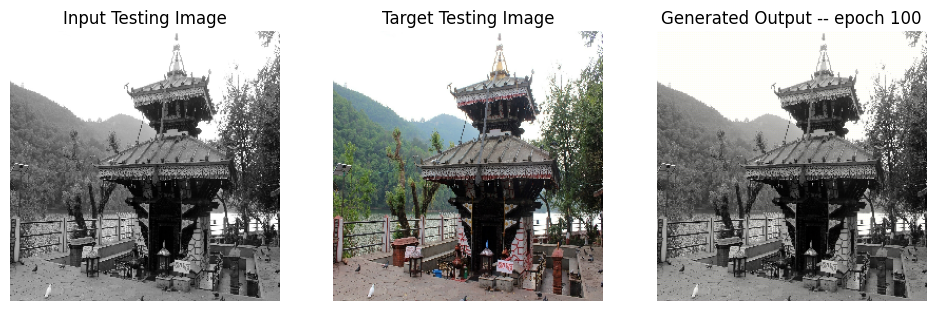

SSIM Score: 0.9456195831298828
PSNR Score: 28.732097625732422


In [47]:
display_random_test_image(gen, '/kaggle/input/monumentimagenotaugmented/train/monumentimage_10000.jpg',100)

In [48]:
import random

each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_generator_l2_losses = []
each_epoch_train_generator_perceptual_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_train_ssim = []
each_epoch_train_psnr = []
each_epoch_train_lpips = []
each_epoch_test_lpips = []
each_epoch_test_psnr = []
each_epoch_test_ssim = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_generator_l2_losses = []
each_epoch_test_generator_perceptual_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_generator_l2_losses = []
train_generator_perceptual_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_generator_l2_losses = []
test_generator_perceptual_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
training_ssim = []
training_psnr = []
training_lpips = []
testing_ssim = []
testing_psnr = []
testing_lpips = []
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):

    # Declare global lists
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_generator_l2_losses, each_epoch_train_generator_perceptual_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses, each_epoch_train_ssim, each_epoch_train_psnr
    global each_epoch_test_psnr, each_epoch_test_ssim, each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_generator_l2_losses, each_epoch_test_generator_perceptual_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses, train_generator_l2_losses, train_generator_perceptual_losses, train_discriminator_losses, train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_l2_losses, test_generator_gan_losses, test_generator_l1_losses, test_generator_perceptual_losses, test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global training_ssim, training_psnr, testing_ssim, testing_psnr, each_epoch_all_records, all_records, LAMBDA, each_epoch_train_lpips, each_epoch_test_lpips, training_lpips, testing_lpips


    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate
    time_start = time.time()
    
    for ep in range(epochs):
        epoch = ep 
        start = time.time()
        train_count = 0
        test_count = 0

        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss,train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
#             each_epoch_train_generator_l2_losses.append(train_gen_l2_loss)
            each_epoch_train_generator_perceptual_losses.append(train_gen_perceptual_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
            each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
            each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
            each_epoch_train_lpips.append(tf.reduce_mean(train_lpips.numpy()))
#             print(train_count)
            train_count += 1
#             print(n)
        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        print("Training Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f} perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_train_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print(f"Number of iteration {train_count}")

        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
#         train_generator_l2_losses.append(np.mean(each_epoch_train_generator_l2_losses))
        train_generator_perceptual_losses.append(np.mean(each_epoch_train_generator_perceptual_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
        training_ssim.append(np.mean(each_epoch_train_ssim))
        training_psnr.append(np.mean(each_epoch_train_psnr))
        training_lpips.append(np.mean(each_epoch_train_lpips))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips = validation_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
#             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
            each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
            each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
            each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
            each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
    
        print("Validation Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        print(f"Number of iteration {test_count}")
#         LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
#         test_generator_l2_losses.append(np.mean(each_epoch_test_generator_l2_losses))
        test_generator_perceptual_losses.append(np.mean(each_epoch_test_generator_perceptual_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
        testing_ssim.append(np.mean(each_epoch_test_ssim))
        testing_psnr.append(np.mean(each_epoch_test_psnr))
        testing_lpips.append(np.mean(each_epoch_test_lpips))

        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
#         each_epoch_test_generator_l2_losses = []
        each_epoch_test_generator_perceptual_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
        each_epoch_test_psnr = []
        each_epoch_test_lpips = []
        each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
#         each_epoch_train_generator_l2_losses = []
        each_epoch_train_generator_perceptual_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
        each_epoch_train_ssim = []
        each_epoch_train_psnr = []
        each_epoch_train_lpips = []
        if time.time() - time_start > 41000:
            stop_training = True
        if epoch == 0 or epoch % 3 == 0:
            # Function to display one random test image
            # def display_random_test_image(images, labels, gen_model):
            #     # Randomly select an index
            #     random_test_image_idx = random.randint(0, len(images) - 1)

            #     # Extract input and target from the selected index
            #     random_test_input = images[random_test_image_idx]
            #     random_test_target = labels[random_test_image_idx]

            #     # Display the image
            #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

            # Example usage
            display_random_test_image(gen, '/kaggle/input/monumentimagenotaugmented/val/monumentimage_10204.jpg', epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if ep > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        
        
#         LAMBDA = LAMBDA*1.003
            # If the condition is met for 4 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 4:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.45, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.3, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0
        # Check the flag variable
        if stop_training:
            break

In [49]:
tf.config.run_functions_eagerly(True)

Epoch 0
80134624/80134624 [==============================] - 3s 0us/step
Training Details
Generator-- total_loss:6.34059 gan_loss:1.04611 l1_loss:0.04573 perceptual_loss:0.00902 Discriminator-- total_loss:1.34142 real_loss:0.66332 generated_loss:0.67810 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 1 is 651.3714184761047 sec
Number of iteration 525
Validation Details
Generator-- total_loss:9.37745 gan_loss:0.44767 l1_loss:0.07936  perceptual_loss:0.01242 Discriminator-- total_loss:1.58737 real_loss:1.11411 generated_loss:0.47327 --- SSIM 0.89410 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 1 is 699.8873760700226 sec
Number of iteration 70
Displaying one random test image...


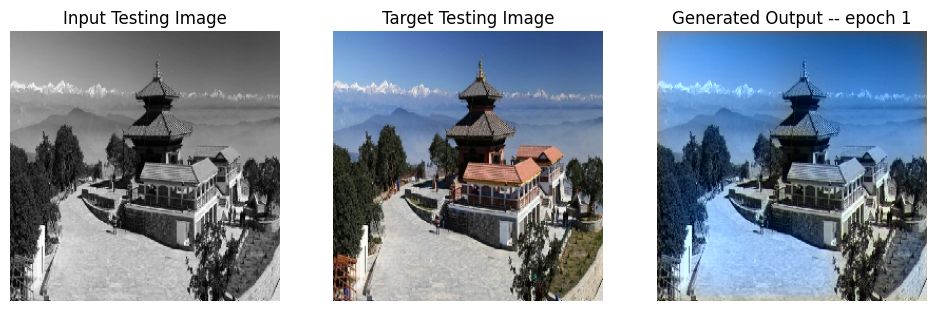

SSIM Score: 0.9129734039306641
PSNR Score: 20.1162052154541
Epoch 1
Training Details
Generator-- total_loss:5.62392 gan_loss:0.96926 l1_loss:0.04040 perceptual_loss:0.00768 Discriminator-- total_loss:1.30986 real_loss:0.64277 generated_loss:0.66710 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 2 is 634.904171705246 sec
Number of iteration 525
Validation Details
Generator-- total_loss:7.68568 gan_loss:0.64080 l1_loss:0.06175  perceptual_loss:0.01088 Discriminator-- total_loss:1.43120 real_loss:0.85309 generated_loss:0.57812 --- SSIM 0.91113 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 2 is 679.8354632854462 sec
Number of iteration 70
Epoch 2
Training Details
Generator-- total_loss:5.58972 gan_loss:0.97529 l1_loss:0.04015 perceptual_loss:0.00749 Discriminator-- total_loss:1.43908 real_loss:0.71293 generated_loss:0.72615 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 3 is 614.8653244972229 sec
Number of iteration 525
Validation Details
Generator-- t

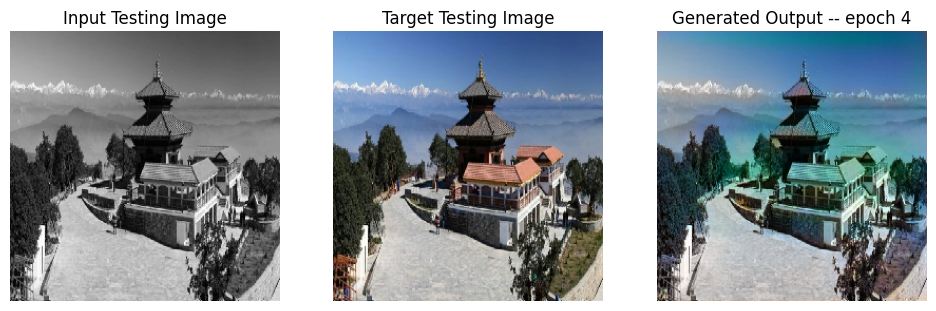

SSIM Score: 0.9347801804542542
PSNR Score: 22.979576110839844
Epoch 4
Training Details
Generator-- total_loss:5.49159 gan_loss:0.90211 l1_loss:0.03994 perceptual_loss:0.00745 Discriminator-- total_loss:1.28587 real_loss:0.63148 generated_loss:0.65439 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 5 is 623.8066074848175 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.82076 gan_loss:1.27077 l1_loss:0.04792  perceptual_loss:0.00947 Discriminator-- total_loss:1.53355 real_loss:0.38510 generated_loss:1.14845 --- SSIM 0.92501 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 5 is 669.3564581871033 sec
Number of iteration 70
Epoch 5
Training Details
Generator-- total_loss:5.43806 gan_loss:0.90933 l1_loss:0.03941 perceptual_loss:0.00735 Discriminator-- total_loss:1.29372 real_loss:0.63371 generated_loss:0.66002 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 6 is 634.1584553718567 sec
Number of iteration 525
Validation Details
Generator-

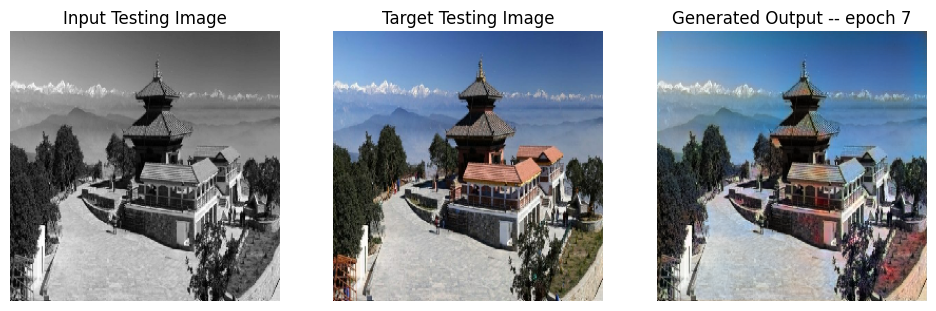

SSIM Score: 0.9623945355415344
PSNR Score: 25.65165901184082
Epoch 7
Training Details
Generator-- total_loss:5.31621 gan_loss:0.87231 l1_loss:0.03871 perceptual_loss:0.00716 Discriminator-- total_loss:1.29379 real_loss:0.63237 generated_loss:0.66141 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 8 is 613.7073826789856 sec
Number of iteration 525
Validation Details
Generator-- total_loss:11.03496 gan_loss:0.52964 l1_loss:0.08941  perceptual_loss:0.01955 Discriminator-- total_loss:1.62652 real_loss:0.98652 generated_loss:0.64000 --- SSIM 0.81065 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 8 is 660.2231755256653 sec
Number of iteration 70
Epoch 8
Training Details
Generator-- total_loss:5.35317 gan_loss:0.88388 l1_loss:0.03895 perceptual_loss:0.00717 Discriminator-- total_loss:1.28286 real_loss:0.62912 generated_loss:0.65375 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 9 is 615.8827927112579 sec
Number of iteration 525
Validation Details
Generator-

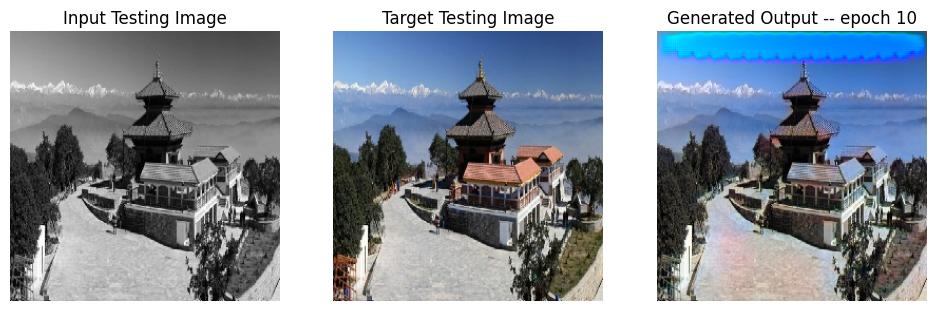

SSIM Score: 0.871985912322998
PSNR Score: 9.823885917663574
Epoch 10
Training Details
Generator-- total_loss:4.99623 gan_loss:0.68685 l1_loss:0.03734 perceptual_loss:0.00719 Discriminator-- total_loss:1.73404 real_loss:0.78731 generated_loss:0.94673 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 11 is 547.4828712940216 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.32343 gan_loss:0.83848 l1_loss:0.04745  perceptual_loss:0.00925 Discriminator-- total_loss:1.46426 real_loss:0.63359 generated_loss:0.83067 --- SSIM 0.93715 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 11 is 593.0135626792908 sec
Number of iteration 70
Epoch 11
Training Details
Generator-- total_loss:11.67278 gan_loss:7.33137 l1_loss:0.03773 perceptual_loss:0.00711 Discriminator-- total_loss:0.11688 real_loss:0.06687 generated_loss:0.05001 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 12 is 407.68229269981384 sec
Number of iteration 525
Validation Details
Gener

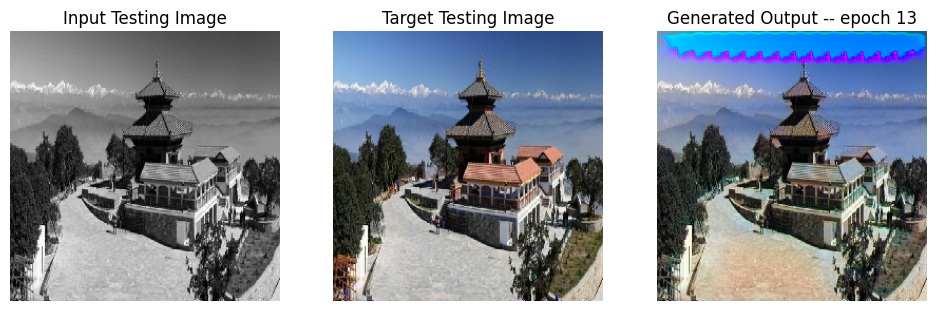

SSIM Score: 0.8723154664039612
PSNR Score: 9.27094841003418
Epoch 13
Training Details
Generator-- total_loss:13.62294 gan_loss:9.30009 l1_loss:0.03756 perceptual_loss:0.00709 Discriminator-- total_loss:0.12536 real_loss:0.06542 generated_loss:0.05994 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 14 is 408.92539405822754 sec
Number of iteration 525
Validation Details
Generator-- total_loss:8.26104 gan_loss:2.58314 l1_loss:0.04928  perceptual_loss:0.00937 Discriminator-- total_loss:1.73365 real_loss:0.34805 generated_loss:1.38560 --- SSIM 0.93215 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 14 is 455.2071633338928 sec
Number of iteration 70
Epoch 14
Training Details
Generator-- total_loss:13.32382 gan_loss:8.98157 l1_loss:0.03772 perceptual_loss:0.00713 Discriminator-- total_loss:0.03780 real_loss:0.02287 generated_loss:0.01493 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 15 is 410.22572779655457 sec
Number of iteration 525
Validation Details
Gen

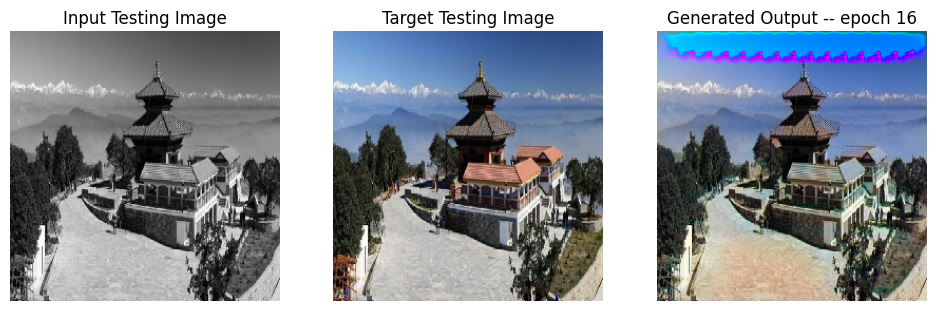

SSIM Score: 0.8719639778137207
PSNR Score: 9.235458374023438
Epoch 16
Training Details
Generator-- total_loss:13.93264 gan_loss:9.58298 l1_loss:0.03779 perceptual_loss:0.00713 Discriminator-- total_loss:0.15728 real_loss:0.08877 generated_loss:0.06850 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 17 is 408.6684453487396 sec
Number of iteration 525
Validation Details
Generator-- total_loss:18.65018 gan_loss:12.96529 l1_loss:0.04936  perceptual_loss:0.00936 Discriminator-- total_loss:9.53106 real_loss:0.00070 generated_loss:9.53036 --- SSIM 0.93192 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 17 is 454.5302014350891 sec
Number of iteration 70
Epoch 17
Training Details
Generator-- total_loss:14.21842 gan_loss:9.87455 l1_loss:0.03774 perceptual_loss:0.00712 Discriminator-- total_loss:0.04817 real_loss:0.01607 generated_loss:0.03211 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 18 is 407.25157833099365 sec
Number of iteration 525
Validation Details
G

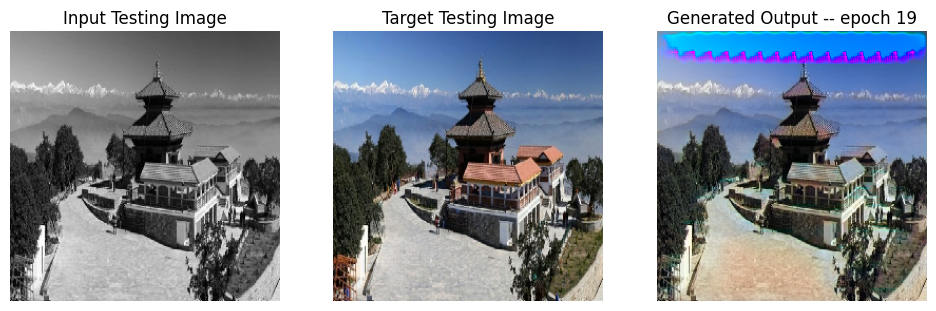

SSIM Score: 0.8720170855522156
PSNR Score: 9.245037078857422
Epoch 19
Training Details
Generator-- total_loss:17.55328 gan_loss:13.21533 l1_loss:0.03769 perceptual_loss:0.00711 Discriminator-- total_loss:0.00031 real_loss:0.00012 generated_loss:0.00019 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 20 is 415.6881206035614 sec
Number of iteration 525
Validation Details
Generator-- total_loss:10.15326 gan_loss:4.50428 l1_loss:0.04904  perceptual_loss:0.00931 Discriminator-- total_loss:3.37641 real_loss:0.15275 generated_loss:3.22366 --- SSIM 0.93246 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 20 is 462.2014729976654 sec
Number of iteration 70
Epoch 20
Training Details
Generator-- total_loss:20.89952 gan_loss:16.55941 l1_loss:0.03770 perceptual_loss:0.00713 Discriminator-- total_loss:0.09412 real_loss:0.03879 generated_loss:0.05533 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 21 is 414.4034779071808 sec
Number of iteration 525
Validation Details
G

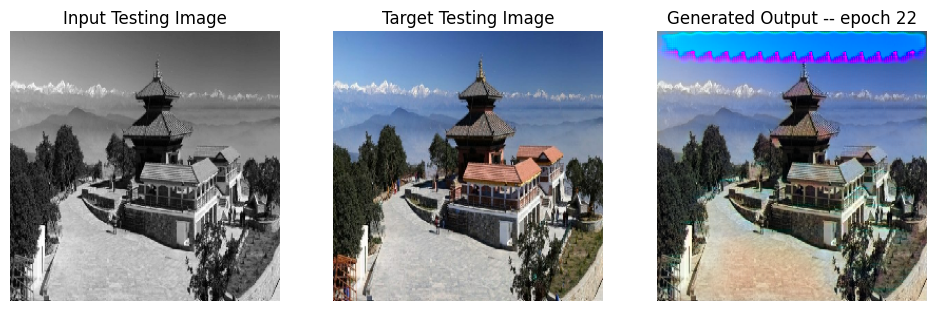

SSIM Score: 0.8713402152061462
PSNR Score: 9.133027076721191
Epoch 22
Training Details
Generator-- total_loss:20.00413 gan_loss:15.66962 l1_loss:0.03764 perceptual_loss:0.00713 Discriminator-- total_loss:0.13675 real_loss:0.05105 generated_loss:0.08570 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 23 is 414.2378966808319 sec
Number of iteration 525
Validation Details
Generator-- total_loss:10.74098 gan_loss:5.11782 l1_loss:0.04881  perceptual_loss:0.00928 Discriminator-- total_loss:3.72073 real_loss:0.44934 generated_loss:3.27140 --- SSIM 0.93272 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 23 is 461.020943403244 sec
Number of iteration 70
Epoch 23
Training Details
Generator-- total_loss:18.84202 gan_loss:14.50446 l1_loss:0.03767 perceptual_loss:0.00713 Discriminator-- total_loss:0.00079 real_loss:0.00043 generated_loss:0.00036 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 24 is 417.12078762054443 sec
Number of iteration 525
Validation Details
G

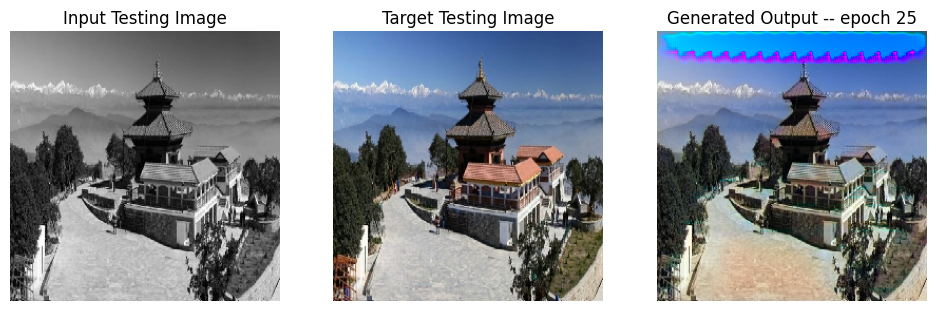

SSIM Score: 0.8716121315956116
PSNR Score: 9.17042064666748
Epoch 25
Training Details
Generator-- total_loss:20.45176 gan_loss:16.11030 l1_loss:0.03771 perceptual_loss:0.00713 Discriminator-- total_loss:0.01461 real_loss:0.01072 generated_loss:0.00389 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 26 is 414.568900346756 sec
Number of iteration 525
Validation Details
Generator-- total_loss:29.19926 gan_loss:23.52791 l1_loss:0.04922  perceptual_loss:0.00936 Discriminator-- total_loss:18.28764 real_loss:0.14817 generated_loss:18.13947 --- SSIM 0.93194 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 26 is 460.6719374656677 sec
Number of iteration 70
Epoch 26
Training Details
Generator-- total_loss:17.99322 gan_loss:13.66011 l1_loss:0.03762 perceptual_loss:0.00714 Discriminator-- total_loss:0.03840 real_loss:0.01387 generated_loss:0.02453 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 27 is 414.56347608566284 sec
Number of iteration 525
Validation Details

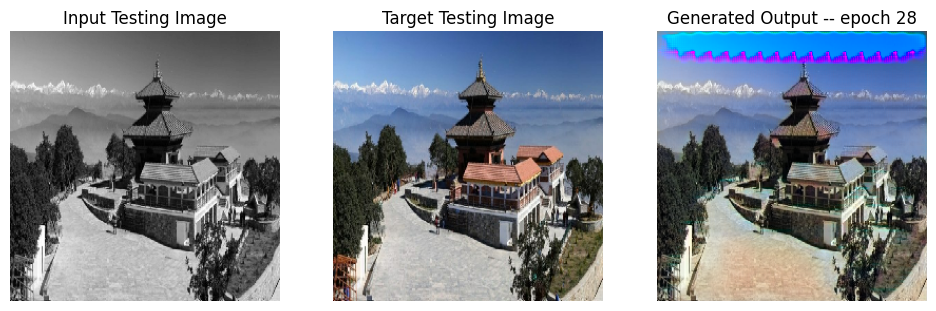

SSIM Score: 0.8718090653419495
PSNR Score: 9.213446617126465
Epoch 28
Training Details
Generator-- total_loss:20.40761 gan_loss:16.07789 l1_loss:0.03761 perceptual_loss:0.00711 Discriminator-- total_loss:0.03383 real_loss:0.01027 generated_loss:0.02357 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 29 is 415.7219922542572 sec
Number of iteration 525
Validation Details
Generator-- total_loss:14.20740 gan_loss:8.58213 l1_loss:0.04882  perceptual_loss:0.00930 Discriminator-- total_loss:6.53283 real_loss:0.00720 generated_loss:6.52563 --- SSIM 0.93290 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 29 is 462.23015999794006 sec
Number of iteration 70
Epoch 29
Training Details
Generator-- total_loss:21.42002 gan_loss:17.08872 l1_loss:0.03763 perceptual_loss:0.00710 Discriminator-- total_loss:0.00035 real_loss:0.00017 generated_loss:0.00018 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 30 is 414.96553015708923 sec
Number of iteration 525
Validation Details

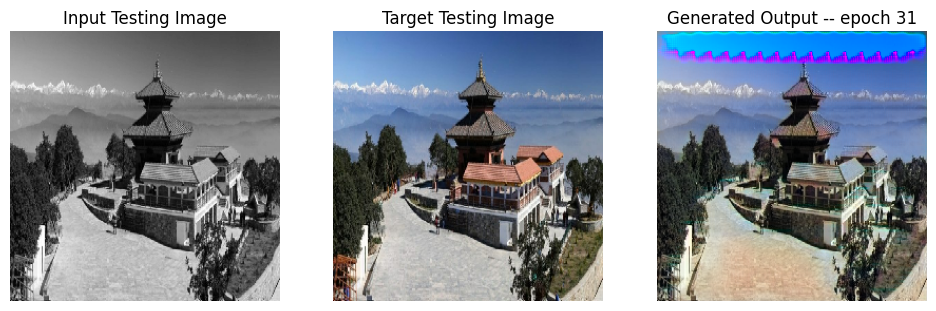

SSIM Score: 0.8712632060050964
PSNR Score: 9.160822868347168
Epoch 31
Training Details
Generator-- total_loss:21.45894 gan_loss:17.11759 l1_loss:0.03772 perceptual_loss:0.00711 Discriminator-- total_loss:0.00003 real_loss:0.00001 generated_loss:0.00002 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 32 is 413.92780113220215 sec
Number of iteration 525
Validation Details
Generator-- total_loss:12.68083 gan_loss:7.04643 l1_loss:0.04892  perceptual_loss:0.00929 Discriminator-- total_loss:5.51316 real_loss:0.08406 generated_loss:5.42910 --- SSIM 0.93251 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 32 is 460.25752329826355 sec
Number of iteration 70
Epoch 32
Training Details
Generator-- total_loss:22.18965 gan_loss:17.85249 l1_loss:0.03768 perceptual_loss:0.00712 Discriminator-- total_loss:0.00013 real_loss:0.00010 generated_loss:0.00004 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 33 is 415.4475598335266 sec
Number of iteration 525
Validation Details

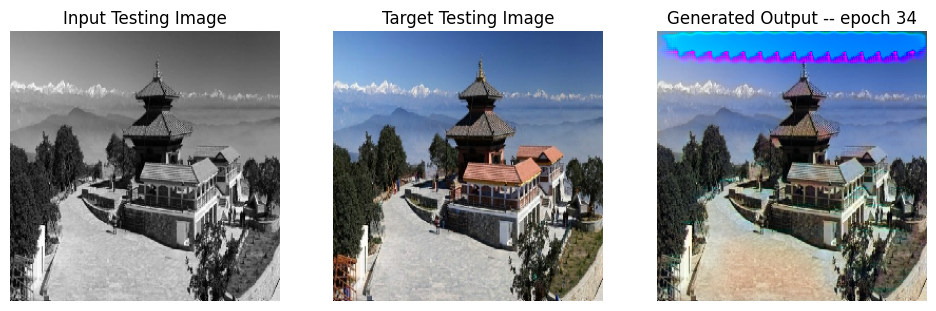

SSIM Score: 0.8715797066688538
PSNR Score: 9.153020858764648
Epoch 34
Training Details
Generator-- total_loss:24.75541 gan_loss:20.42590 l1_loss:0.03761 perceptual_loss:0.00711 Discriminator-- total_loss:0.08421 real_loss:0.04227 generated_loss:0.04194 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 35 is 416.0172472000122 sec
Number of iteration 525
Validation Details
Generator-- total_loss:19.43309 gan_loss:13.77647 l1_loss:0.04911  perceptual_loss:0.00932 Discriminator-- total_loss:10.15041 real_loss:0.73903 generated_loss:9.41138 --- SSIM 0.93252 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 35 is 462.1577160358429 sec
Number of iteration 70
Epoch 35
Training Details
Generator-- total_loss:21.75997 gan_loss:17.42876 l1_loss:0.03761 perceptual_loss:0.00713 Discriminator-- total_loss:0.00159 real_loss:0.00049 generated_loss:0.00110 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 36 is 415.0719790458679 sec
Number of iteration 525
Validation Details

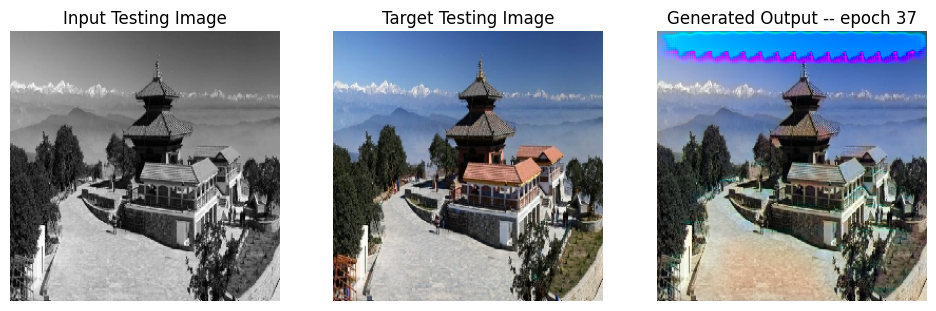

SSIM Score: 0.8717244267463684
PSNR Score: 9.135038375854492
Epoch 37
Training Details
Generator-- total_loss:23.78432 gan_loss:19.45684 l1_loss:0.03759 perceptual_loss:0.00710 Discriminator-- total_loss:0.00032 real_loss:0.00025 generated_loss:0.00007 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 38 is 417.2689516544342 sec
Number of iteration 525
Validation Details
Generator-- total_loss:16.65928 gan_loss:11.00508 l1_loss:0.04906  perceptual_loss:0.00935 Discriminator-- total_loss:8.58041 real_loss:0.03545 generated_loss:8.54496 --- SSIM 0.93265 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 38 is 463.39018750190735 sec
Number of iteration 70
Epoch 38
Training Details
Generator-- total_loss:24.50360 gan_loss:20.16350 l1_loss:0.03770 perceptual_loss:0.00713 Discriminator-- total_loss:0.01806 real_loss:0.00778 generated_loss:0.01028 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 39 is 419.1558337211609 sec
Number of iteration 525
Validation Details

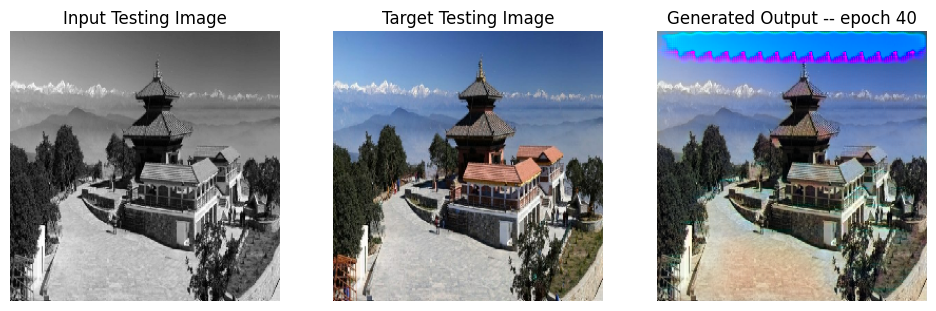

SSIM Score: 0.8716235756874084
PSNR Score: 9.172022819519043
Epoch 40
Training Details
Generator-- total_loss:35.82577 gan_loss:31.49108 l1_loss:0.03767 perceptual_loss:0.00710 Discriminator-- total_loss:0.00101 real_loss:0.00058 generated_loss:0.00043 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 41 is 421.0042428970337 sec
Number of iteration 525
Validation Details
Generator-- total_loss:22.36956 gan_loss:16.76250 l1_loss:0.04864  perceptual_loss:0.00928 Discriminator-- total_loss:10.99582 real_loss:0.14674 generated_loss:10.84909 --- SSIM 0.93314 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 41 is 468.67264461517334 sec
Number of iteration 70
Epoch 41
Training Details
Generator-- total_loss:34.54274 gan_loss:30.21281 l1_loss:0.03761 perceptual_loss:0.00711 Discriminator-- total_loss:0.00008 real_loss:0.00005 generated_loss:0.00003 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 42 is 420.3404688835144 sec
Number of iteration 525
Validation Detai

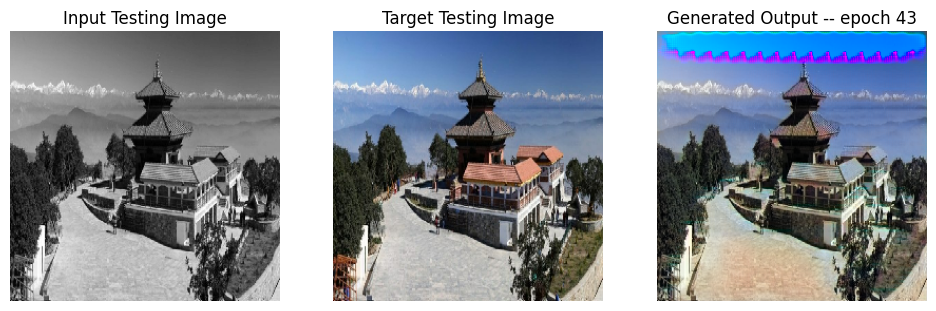

SSIM Score: 0.8715298175811768
PSNR Score: 9.177725791931152
Epoch 43
Training Details
Generator-- total_loss:34.34177 gan_loss:29.99718 l1_loss:0.03774 perceptual_loss:0.00714 Discriminator-- total_loss:0.00000 real_loss:0.00000 generated_loss:0.00000 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 44 is 420.7002532482147 sec
Number of iteration 525
Validation Details
Generator-- total_loss:22.40859 gan_loss:16.77007 l1_loss:0.04888  perceptual_loss:0.00938 Discriminator-- total_loss:10.89019 real_loss:0.01497 generated_loss:10.87521 --- SSIM 0.93259 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 44 is 467.81551241874695 sec
Number of iteration 70
Epoch 44
Training Details
Generator-- total_loss:33.45778 gan_loss:29.12739 l1_loss:0.03759 perceptual_loss:0.00714 Discriminator-- total_loss:0.00001 real_loss:0.00000 generated_loss:0.00001 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 45 is 419.275283575058 sec
Number of iteration 525
Validation Detail

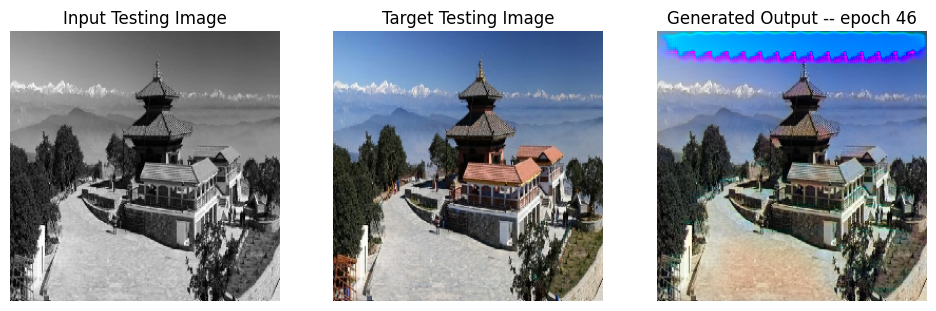

SSIM Score: 0.8715761303901672
PSNR Score: 9.205523490905762
Reduced generator learning rate to 0.0004500000213738531 at epoch 46
Epoch 46
Training Details
Generator-- total_loss:3.97771 gan_loss:0.14606 l1_loss:0.03312 perceptual_loss:0.00650 Discriminator-- total_loss:60.36417 real_loss:60.36417 generated_loss:0.00000 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 47 is 556.2280783653259 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.43761 gan_loss:0.00000 l1_loss:0.03788  perceptual_loss:0.00812 Discriminator-- total_loss:44.15792 real_loss:44.15791 generated_loss:0.00000 --- SSIM 0.94903 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 47 is 603.8693408966064 sec
Number of iteration 70
Epoch 47
Training Details
Generator-- total_loss:3.70480 gan_loss:0.00183 l1_loss:0.03210 perceptual_loss:0.00616 Discriminator-- total_loss:63.22098 real_loss:63.22093 generated_loss:0.00005 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 48

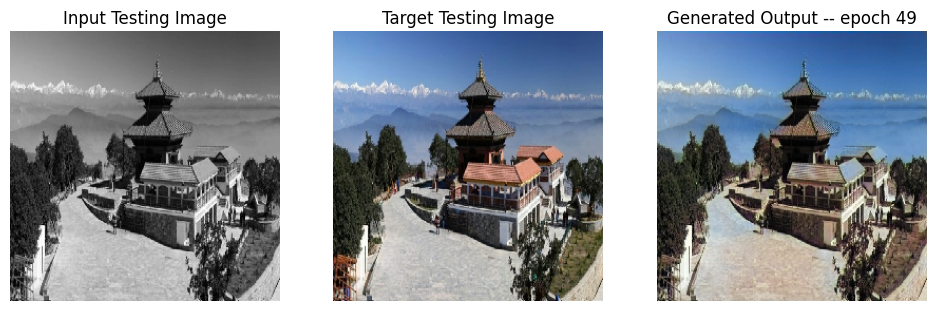

SSIM Score: 0.9682758450508118
PSNR Score: 26.56564712524414
Epoch 49
Training Details
Generator-- total_loss:3.66493 gan_loss:0.00196 l1_loss:0.03179 perceptual_loss:0.00605 Discriminator-- total_loss:63.63192 real_loss:63.63191 generated_loss:0.00001 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 50 is 551.138237953186 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.29286 gan_loss:0.00000 l1_loss:0.03686  perceptual_loss:0.00758 Discriminator-- total_loss:57.28263 real_loss:57.28263 generated_loss:0.00001 --- SSIM 0.94982 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 50 is 598.2471814155579 sec
Number of iteration 70
Epoch 50
Training Details
Generator-- total_loss:3.65291 gan_loss:0.00124 l1_loss:0.03170 perceptual_loss:0.00603 Discriminator-- total_loss:62.87688 real_loss:62.87680 generated_loss:0.00007 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 51 is 550.459883928299 sec
Number of iteration 525
Validation Details
Ge

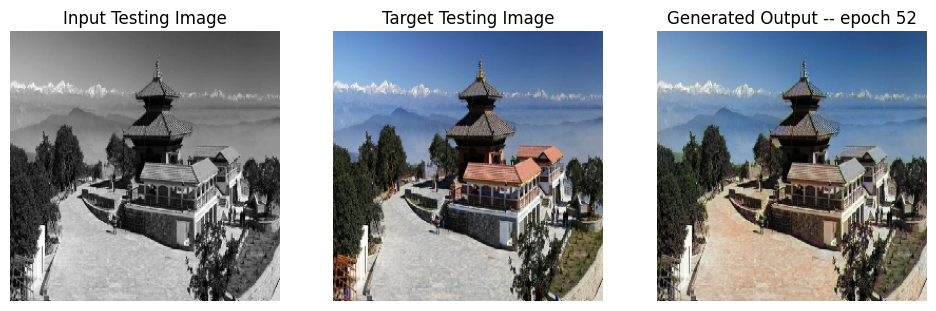

SSIM Score: 0.974757730960846
PSNR Score: 26.958646774291992
Epoch 52
Training Details
Generator-- total_loss:3.62931 gan_loss:0.00135 l1_loss:0.03151 perceptual_loss:0.00596 Discriminator-- total_loss:63.14378 real_loss:63.14376 generated_loss:0.00002 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 53 is 563.624486207962 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.36605 gan_loss:0.00000 l1_loss:0.03765  perceptual_loss:0.00752 Discriminator-- total_loss:58.38430 real_loss:58.38430 generated_loss:0.00000 --- SSIM 0.94834 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 53 is 611.3593385219574 sec
Number of iteration 70
Epoch 53
Training Details
Generator-- total_loss:3.61471 gan_loss:0.00172 l1_loss:0.03137 perceptual_loss:0.00595 Discriminator-- total_loss:64.58305 real_loss:64.58302 generated_loss:0.00002 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 54 is 556.6820034980774 sec
Number of iteration 525
Validation Details
G

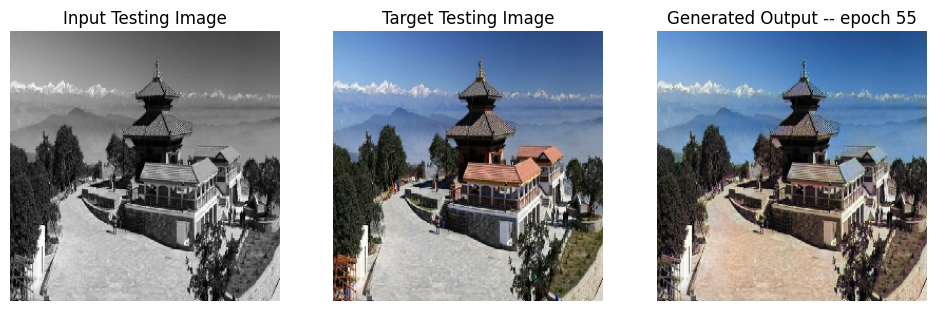

SSIM Score: 0.97212153673172
PSNR Score: 26.122102737426758
Epoch 55
Training Details
Generator-- total_loss:22.65945 gan_loss:19.00513 l1_loss:0.03175 perceptual_loss:0.00600 Discriminator-- total_loss:0.01617 real_loss:0.00819 generated_loss:0.00798 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 56 is 413.6536867618561 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.25603 gan_loss:0.00528 l1_loss:0.03649  perceptual_loss:0.00752 Discriminator-- total_loss:13.17505 real_loss:13.16509 generated_loss:0.00996 --- SSIM 0.95011 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 56 is 460.00463342666626 sec
Number of iteration 70
Epoch 56
Training Details
Generator-- total_loss:23.12436 gan_loss:19.47555 l1_loss:0.03173 perceptual_loss:0.00595 Discriminator-- total_loss:0.00423 real_loss:0.00183 generated_loss:0.00240 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 57 is 407.5218069553375 sec
Number of iteration 525
Validation Details


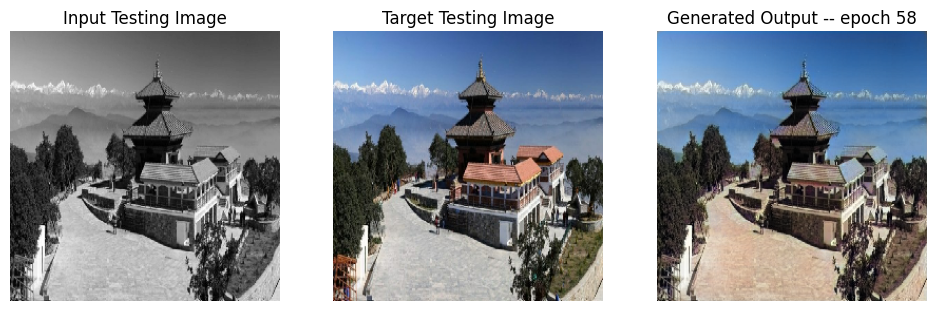

SSIM Score: 0.9721519947052002
PSNR Score: 26.12383270263672
Epoch 58
Training Details
Generator-- total_loss:21.94465 gan_loss:18.29639 l1_loss:0.03172 perceptual_loss:0.00595 Discriminator-- total_loss:0.00776 real_loss:0.00402 generated_loss:0.00374 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 59 is 405.30887269973755 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.25728 gan_loss:0.01813 l1_loss:0.03640  perceptual_loss:0.00749 Discriminator-- total_loss:10.62367 real_loss:10.60753 generated_loss:0.01614 --- SSIM 0.95021 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 59 is 451.0750296115875 sec
Number of iteration 70
Epoch 59
Training Details
Generator-- total_loss:22.03361 gan_loss:18.38334 l1_loss:0.03173 perceptual_loss:0.00596 Discriminator-- total_loss:0.02136 real_loss:0.01149 generated_loss:0.00987 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 60 is 406.10891914367676 sec
Number of iteration 525
Validation Detail

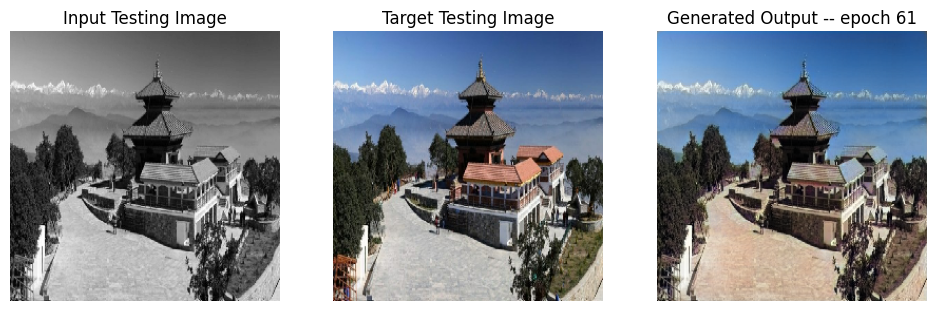

SSIM Score: 0.9720215201377869
PSNR Score: 26.105113983154297
Epoch 61
Training Details
Generator-- total_loss:24.16526 gan_loss:20.51403 l1_loss:0.03175 perceptual_loss:0.00595 Discriminator-- total_loss:0.00038 real_loss:0.00018 generated_loss:0.00020 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 62 is 407.2824008464813 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.24757 gan_loss:0.00897 l1_loss:0.03636  perceptual_loss:0.00753 Discriminator-- total_loss:11.04051 real_loss:11.02684 generated_loss:0.01368 --- SSIM 0.95005 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 62 is 453.6424949169159 sec
Number of iteration 70
Epoch 62
Training Details
Generator-- total_loss:25.68794 gan_loss:22.03663 l1_loss:0.03172 perceptual_loss:0.00599 Discriminator-- total_loss:0.00755 real_loss:0.00355 generated_loss:0.00400 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 63 is 408.04770398139954 sec
Number of iteration 525
Validation Detail

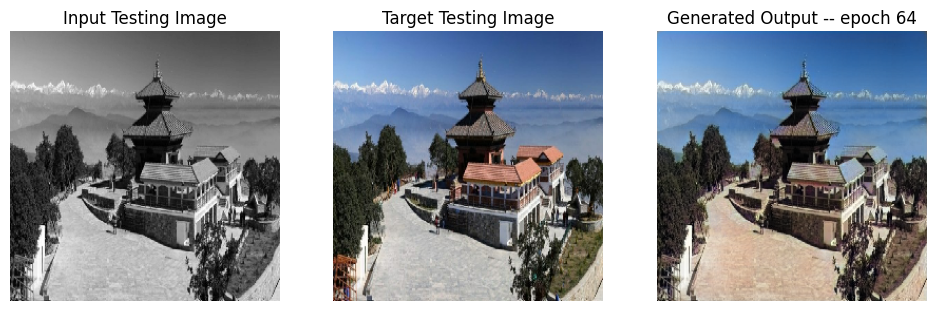

SSIM Score: 0.9722566604614258
PSNR Score: 26.16559600830078
Epoch 64
Training Details
Generator-- total_loss:23.41848 gan_loss:19.76372 l1_loss:0.03177 perceptual_loss:0.00597 Discriminator-- total_loss:0.01633 real_loss:0.00561 generated_loss:0.01072 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 65 is 407.94362354278564 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.24584 gan_loss:0.00457 l1_loss:0.03642  perceptual_loss:0.00750 Discriminator-- total_loss:12.75480 real_loss:12.74084 generated_loss:0.01397 --- SSIM 0.94972 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 65 is 454.3559582233429 sec
Number of iteration 70
Epoch 65
Training Details
Generator-- total_loss:24.06410 gan_loss:20.41824 l1_loss:0.03169 perceptual_loss:0.00596 Discriminator-- total_loss:0.00663 real_loss:0.00121 generated_loss:0.00542 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 66 is 408.98211765289307 sec
Number of iteration 525
Validation Detail

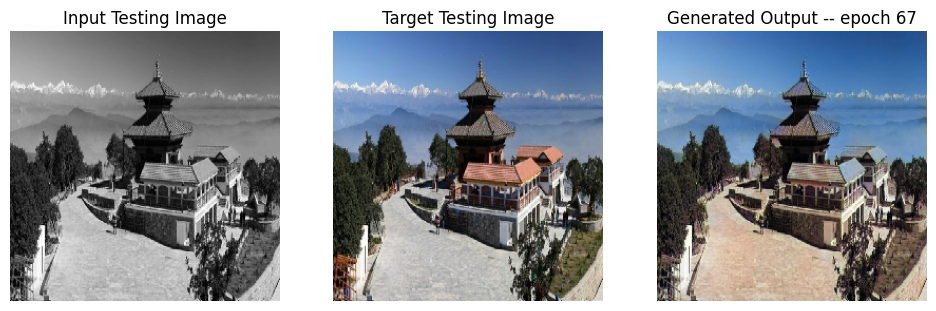

SSIM Score: 0.9721378684043884
PSNR Score: 26.16646385192871
Reduced generator learning rate to 0.0002025000096182339 at epoch 67
Epoch 67
Training Details
Generator-- total_loss:3.85370 gan_loss:0.08952 l1_loss:0.03275 perceptual_loss:0.00612 Discriminator-- total_loss:26.89334 real_loss:26.89264 generated_loss:0.00070 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 68 is 545.5727038383484 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.34008 gan_loss:0.00007 l1_loss:0.03742  perceptual_loss:0.00747 Discriminator-- total_loss:28.75772 real_loss:28.75742 generated_loss:0.00030 --- SSIM 0.94364 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 68 is 592.3018023967743 sec
Number of iteration 70
Epoch 68
Training Details
Generator-- total_loss:3.69851 gan_loss:0.01263 l1_loss:0.03207 perceptual_loss:0.00598 Discriminator-- total_loss:25.78095 real_loss:25.78082 generated_loss:0.00013 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 69

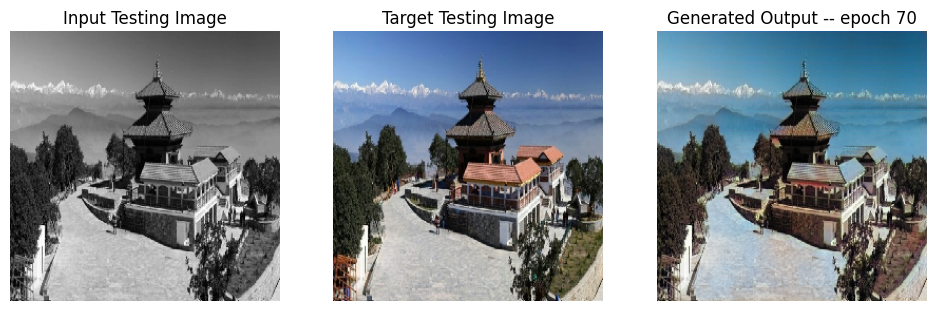

SSIM Score: 0.938743531703949
PSNR Score: 25.56389808654785
Epoch 70
Training Details
Generator-- total_loss:3.70617 gan_loss:0.01320 l1_loss:0.03213 perceptual_loss:0.00600 Discriminator-- total_loss:25.75577 real_loss:25.75557 generated_loss:0.00020 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 71 is 542.0819146633148 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.28053 gan_loss:0.00008 l1_loss:0.03672  perceptual_loss:0.00760 Discriminator-- total_loss:24.71631 real_loss:24.71598 generated_loss:0.00033 --- SSIM 0.94711 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 71 is 588.472980260849 sec
Number of iteration 70
Epoch 71
Training Details
Generator-- total_loss:3.64175 gan_loss:0.01021 l1_loss:0.03161 perceptual_loss:0.00588 Discriminator-- total_loss:21.09118 real_loss:21.09098 generated_loss:0.00019 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 72 is 546.8621687889099 sec
Number of iteration 525
Validation Details
Ge

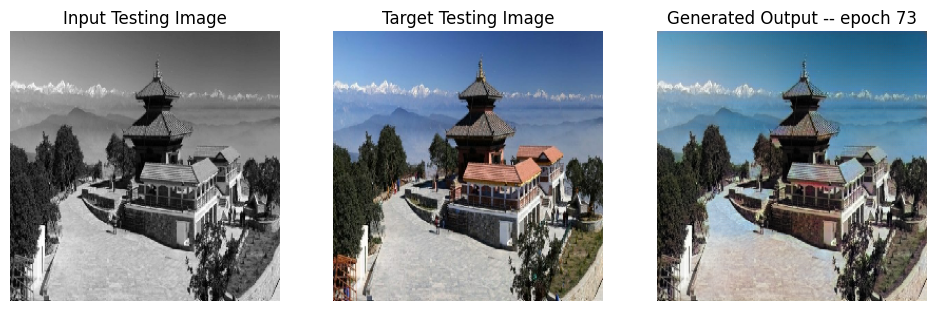

SSIM Score: 0.9488577842712402
PSNR Score: 26.305253982543945
Epoch 73
Training Details
Generator-- total_loss:3.65396 gan_loss:0.01037 l1_loss:0.03171 perceptual_loss:0.00591 Discriminator-- total_loss:22.72700 real_loss:22.72507 generated_loss:0.00192 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 74 is 548.8288037776947 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.35288 gan_loss:0.00011 l1_loss:0.03759  perceptual_loss:0.00742 Discriminator-- total_loss:28.68407 real_loss:28.68374 generated_loss:0.00032 --- SSIM 0.94143 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 74 is 595.397027015686 sec
Number of iteration 70
Epoch 74
Training Details
Generator-- total_loss:3.66344 gan_loss:0.01117 l1_loss:0.03179 perceptual_loss:0.00592 Discriminator-- total_loss:24.24251 real_loss:24.24151 generated_loss:0.00100 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 75 is 547.7690901756287 sec
Number of iteration 525
Validation Details


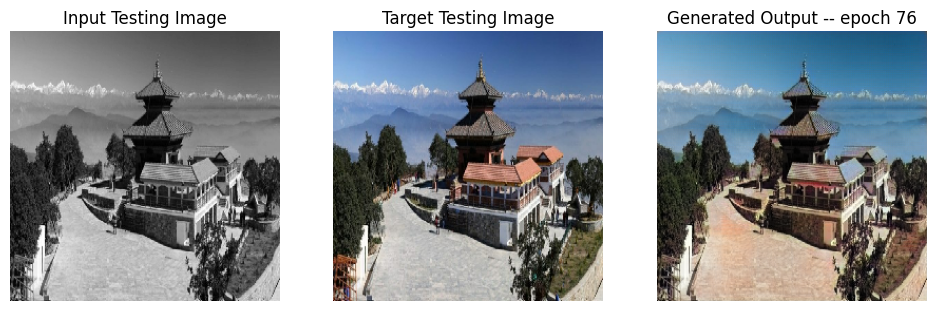

SSIM Score: 0.9453728795051575
PSNR Score: 25.425586700439453
Epoch 76
Training Details
Generator-- total_loss:3.61386 gan_loss:0.00978 l1_loss:0.03138 perceptual_loss:0.00583 Discriminator-- total_loss:20.54723 real_loss:20.54663 generated_loss:0.00059 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 77 is 542.518388748169 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.27542 gan_loss:0.00009 l1_loss:0.03681  perceptual_loss:0.00743 Discriminator-- total_loss:27.32061 real_loss:27.32023 generated_loss:0.00038 --- SSIM 0.94465 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 77 is 588.6917822360992 sec
Number of iteration 70
Epoch 77
Training Details
Generator-- total_loss:3.61621 gan_loss:0.00903 l1_loss:0.03140 perceptual_loss:0.00584 Discriminator-- total_loss:20.50553 real_loss:20.50513 generated_loss:0.00040 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 78 is 541.4350962638855 sec
Number of iteration 525
Validation Details


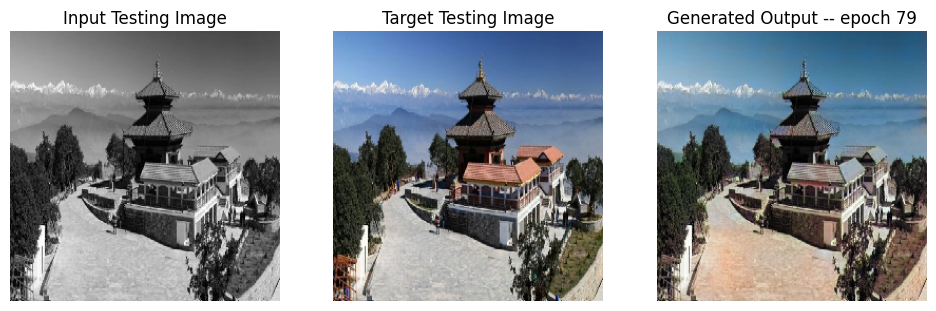

SSIM Score: 0.958745002746582
PSNR Score: 26.1452693939209


In [50]:
fit(train_dataset, epochs, validation_dataset, gen)

/tmp/ipykernel_26/1385076028.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-or" (-> color='r'). The keyword argument will take precedence.
  plt.plot(epochs, train_discriminator_losses, '-or', color='orange', label='Discriminator Loss')


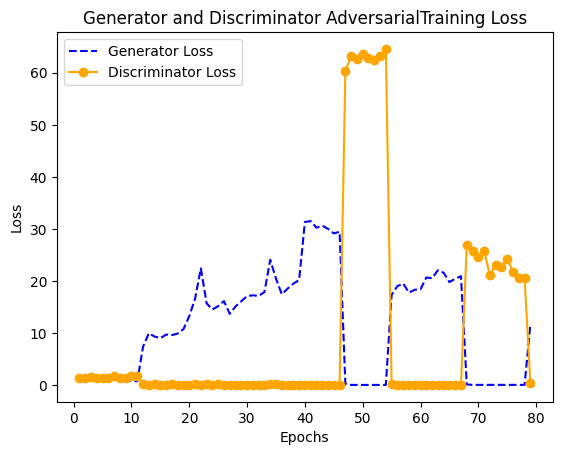

In [51]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Generator Loss')
plt.plot(epochs, train_discriminator_losses, '-or', color='orange', label='Discriminator Loss')
plt.title('Generator and Discriminator AdversarialTraining Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

/tmp/ipykernel_26/4010479747.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-or" (-> color='r'). The keyword argument will take precedence.
  plt.plot(epochs, test_discriminator_losses, '-or', color='orange', label='Discriminator Loss')


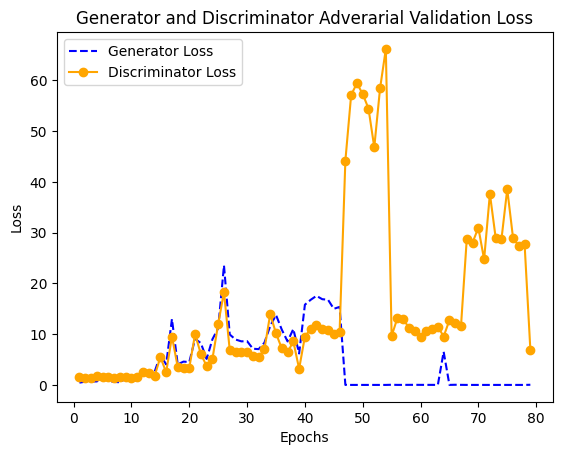

In [52]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_gan_losses, '--b', label='Generator Loss')
plt.plot(epochs, test_discriminator_losses, '-or', color='orange', label='Discriminator Loss')
plt.title('Generator and Discriminator Adverarial Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

/tmp/ipykernel_26/825315398.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-or" (-> color='r'). The keyword argument will take precedence.
  plt.plot(epochs, testing_ssim, '-or', color='orange', label='Validation SSIM')


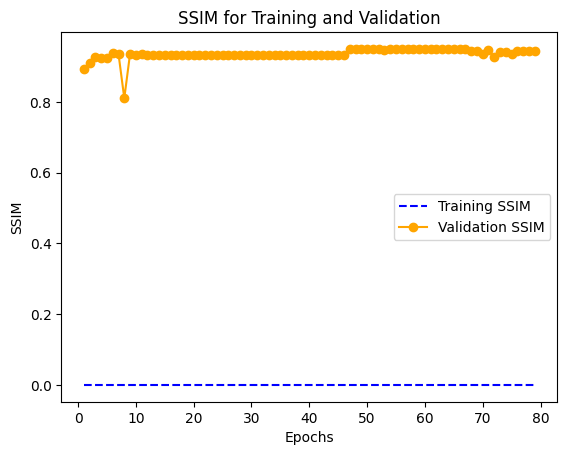

In [53]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_ssim, '--b', label='Training SSIM')
plt.plot(epochs, testing_ssim, '-or', color='orange', label='Validation SSIM')
plt.title('SSIM for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.savefig('/kaggle/working/SSIM_plot_1.png')
plt.show()

/tmp/ipykernel_26/1818322218.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-or" (-> color='r'). The keyword argument will take precedence.
  plt.plot(epochs, testing_psnr, '-or', color='orange', label='Validation PSNR')


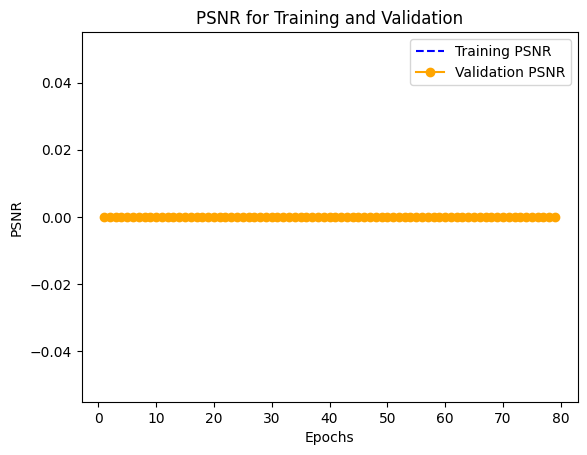

In [54]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_psnr, '--b', label='Training PSNR')
plt.plot(epochs, testing_psnr, '-or', color='orange', label='Validation PSNR')
plt.title('PSNR for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.savefig('/kaggle/working/PSNR_plot_1.png')
plt.show()

/tmp/ipykernel_26/136468053.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-or" (-> color='r'). The keyword argument will take precedence.
  plt.plot(epochs, testing_lpips, '-or', color='orange', label='Validation LPIPS')


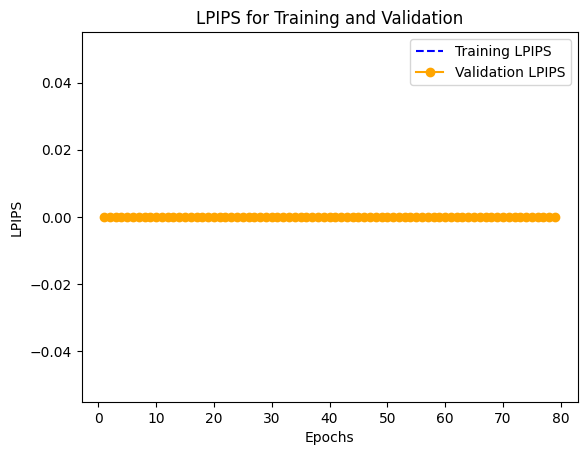

In [55]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_lpips, '--b', label='Training LPIPS')
plt.plot(epochs, testing_lpips, '-or', color='orange', label='Validation LPIPS')
plt.title('LPIPS for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('LPIPS')
plt.legend()
plt.savefig('/kaggle/working/LPIPS_plot_1.png')
plt.show()

/tmp/ipykernel_26/3235268261.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-or" (-> color='r'). The keyword argument will take precedence.
  plt.plot(epochs, test_generator_gan_losses,'-or', color='orange', label='Validation_Generator_GAN_Loss')


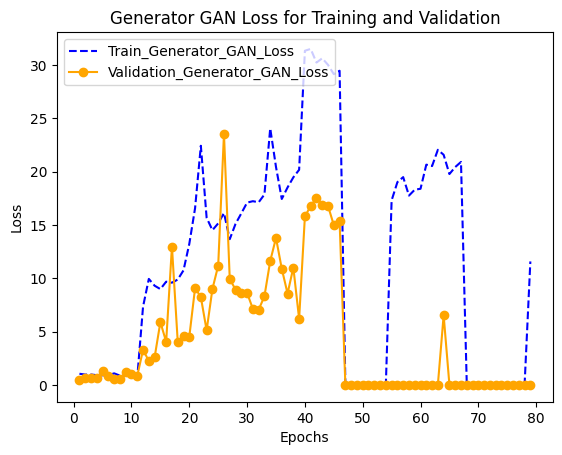

In [56]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train_Generator_GAN_Loss')
plt.plot(epochs, test_generator_gan_losses,'-or', color='orange', label='Validation_Generator_GAN_Loss')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

/tmp/ipykernel_26/271018654.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-or" (-> color='r'). The keyword argument will take precedence.
  plt.plot(epochs, test_generator_l1_losses, '-or', color='orange', label='Validation_Generator_L1_Loss')


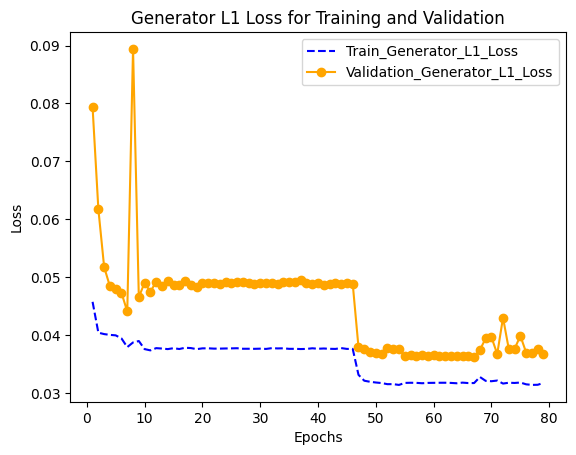

In [57]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train_Generator_L1_Loss')
plt.plot(epochs, test_generator_l1_losses, '-or', color='orange', label='Validation_Generator_L1_Loss')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

/tmp/ipykernel_26/1114805691.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-or" (-> color='r'). The keyword argument will take precedence.
  plt.plot(epochs, test_generator_perceptual_losses, '-or', color='orange', label='Validation_Generator_Perceptual_Loss')


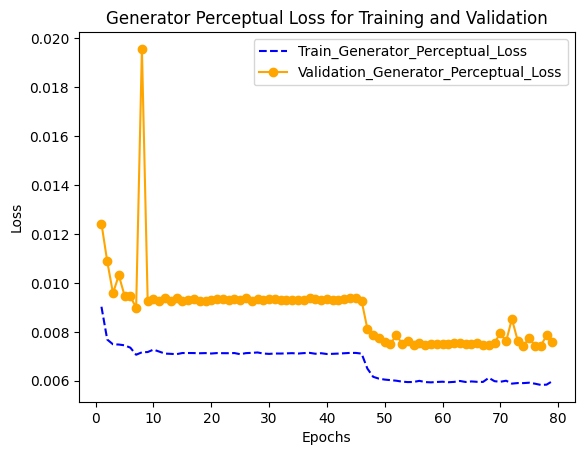

In [58]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_perceptual_losses, '--b', label='Train_Generator_Perceptual_Loss')
plt.plot(epochs, test_generator_perceptual_losses, '-or', color='orange', label='Validation_Generator_Perceptual_Loss')
plt.title('Generator Perceptual Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_Perceptual_plot_1.png')
plt.show()

/tmp/ipykernel_26/1582919640.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-or" (-> color='r'). The keyword argument will take precedence.
  plt.plot(epochs, test_generator_losses, '-or', color='orange', label='Validation_Generator_Loss')


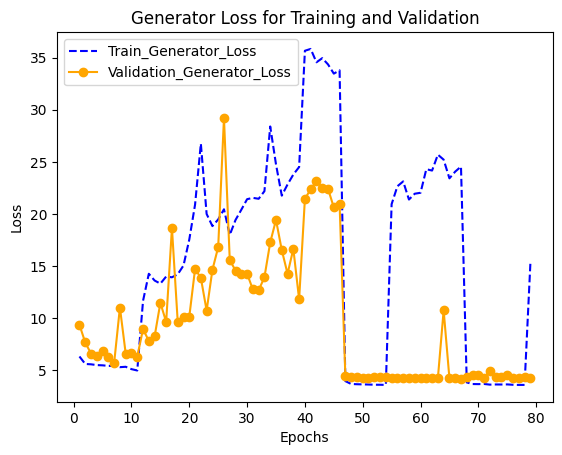

In [59]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train_Generator_Loss')
plt.plot(epochs, test_generator_losses, '-or', color='orange', label='Validation_Generator_Loss')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

/tmp/ipykernel_26/1374437368.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-or" (-> color='r'). The keyword argument will take precedence.
  plt.plot(epochs, test_discriminator_losses, '-or', color='orange', label='Validation_Discriminator_Loss')


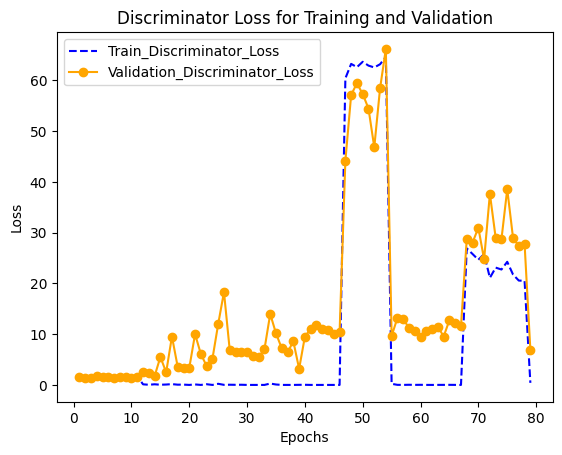

In [60]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train_Discriminator_Loss')
plt.plot(epochs, test_discriminator_losses, '-or', color='orange', label='Validation_Discriminator_Loss')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

/tmp/ipykernel_26/1497767744.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-or" (-> color='r'). The keyword argument will take precedence.
  plt.plot(epochs, test_discriminator_real_losses, '-or', color='orange', label='Validation_Discriminator_Real_Loss')


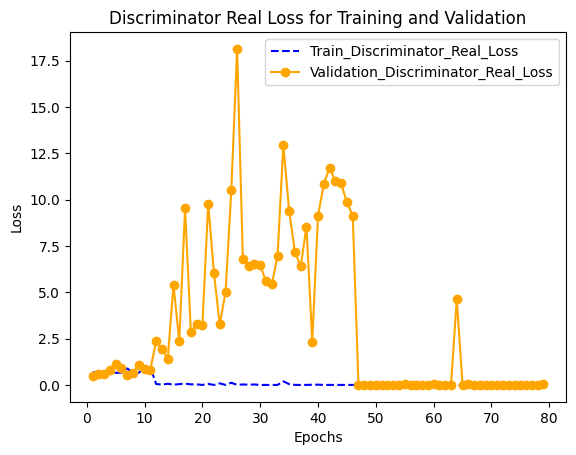

In [61]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train_Discriminator_Real_Loss')
plt.plot(epochs, test_discriminator_real_losses, '-or', color='orange', label='Validation_Discriminator_Real_Loss')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

/tmp/ipykernel_26/1197813443.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-or" (-> color='r'). The keyword argument will take precedence.
  plt.plot(epochs, test_discriminator_generated_losses,'-or', color='orange', label='Validation_Discriminator_Generated_Loss')


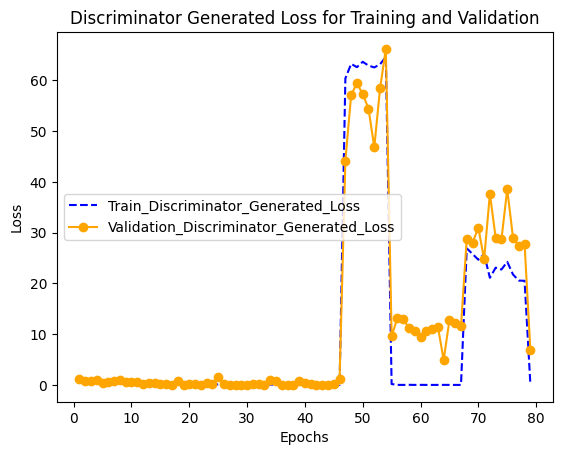

In [62]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train_Discriminator_Generated_Loss')
plt.plot(epochs, test_discriminator_generated_losses,'-or', color='orange', label='Validation_Discriminator_Generated_Loss')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [63]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [64]:
# # Evaluation on testing data


# each_epoch_test_lpips = []
# each_epoch_test_psnr = []
# each_epoch_test_ssim = []
# each_epoch_test_fid = []
# each_epoch_test_generator_losses = []
# each_epoch_test_generator_gan_losses = []
# each_epoch_test_generator_l1_losses = []
# each_epoch_test_generator_l2_losses = []
# each_epoch_test_generator_perceptual_losses = []
# each_epoch_test_discriminator_losses = []
# each_epoch_test_discriminator_real_losses = []
# each_epoch_test_discriminator_generated_losses = []

# for n, (input_, target) in test_dataset.enumerate():
#     test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips, test_fid = test_step(input_, target)

#     each_epoch_test_generator_losses.append(test_gen_loss)
#     each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
#     each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
# #             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
#     each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
#     each_epoch_test_discriminator_losses.append(test_disc_loss)
#     each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
#     each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
#     each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
#     each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
#     each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
#     each_epoch_test_fid.append(test_fid)
#     print(test_fid)

# print("Testing Details")
# print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} \nDiscriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- \nSSIM {:.5f} \nPSNR {:.5f} \nLPIPS {:.5f} \nFID Score: {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips), np.mean(each_epoch_test_fid)))

In [65]:
os.mkdir('/kaggle/working/modelsFeb7')

In [66]:
gen.save('/kaggle/working/modelsFeb7/gen.h5')
gen.save_weights('/kaggle/working/modelsFeb7/gen_weight.keras')
disc.save('/kaggle/working/modelsFeb7/disc.h5')
disc.save_weights('/kaggle/working/modelsFeb7/disc_wweight.keras')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [67]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode !=0:
        print("Unable to run zip command")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [68]:
import subprocess
from IPython.display import FileLink, display

In [69]:
download_file('/kaggle/working', 'outputFeb10')

/kaggle/working/outputFeb10.zip